### Increase Brightness / Contrast

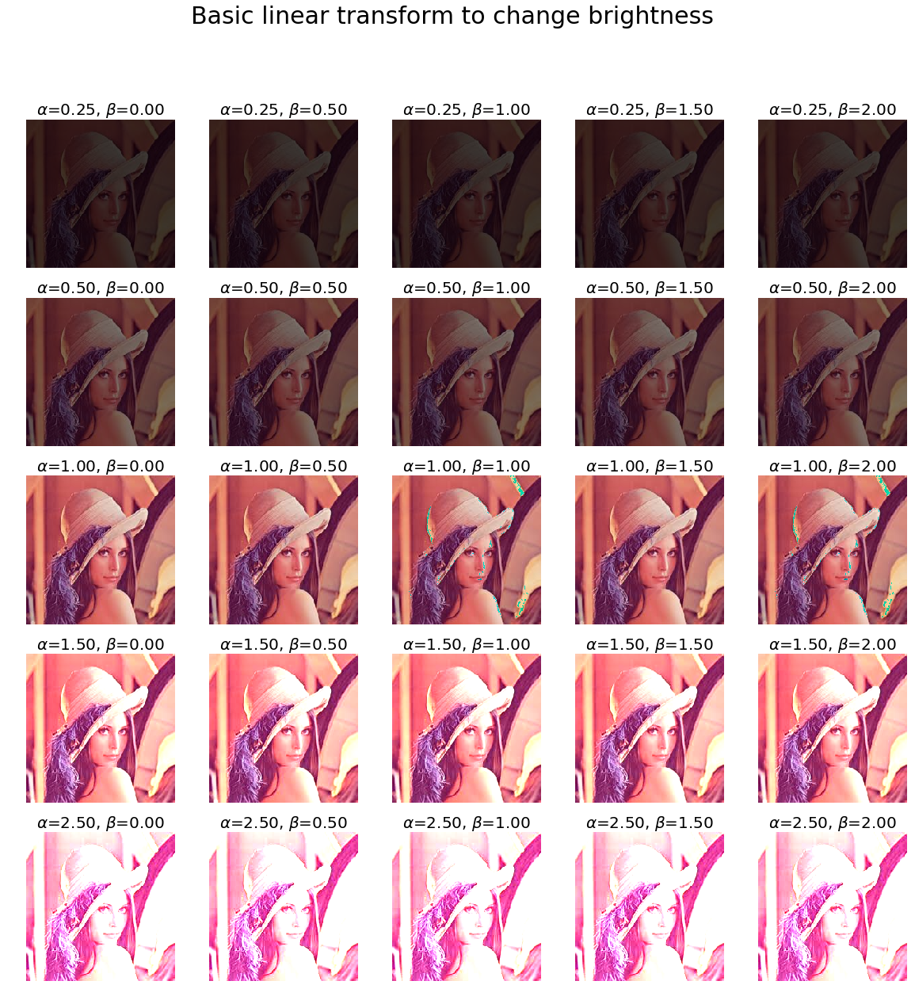

In [91]:
% matplotlib inline
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread

def basic_linear_transform(img, alpha, beta):
    return np.clip(alpha*img+beta, 0, 255).astype(np.uint8)

image = imread('images/lena.jpg') 

plt.figure(figsize=(20,20))
i = 1
for alpha in [0.25, 0.5, 1, 1.5, 2.5]:
    for beta in [0, 0.5, 1, 1.5, 2]:
        image_corrected = basic_linear_transform(image, alpha, beta)
        plt.subplot(5,5,i), plt.imshow(image_corrected), plt.axis('off')
        plt.title(r'$\alpha$={:.2f}, $\beta$={:.2f}'.format(alpha, beta), size=20)
        i += 1
plt.suptitle('Basic linear transform to change brightness', size=30)
plt.show()

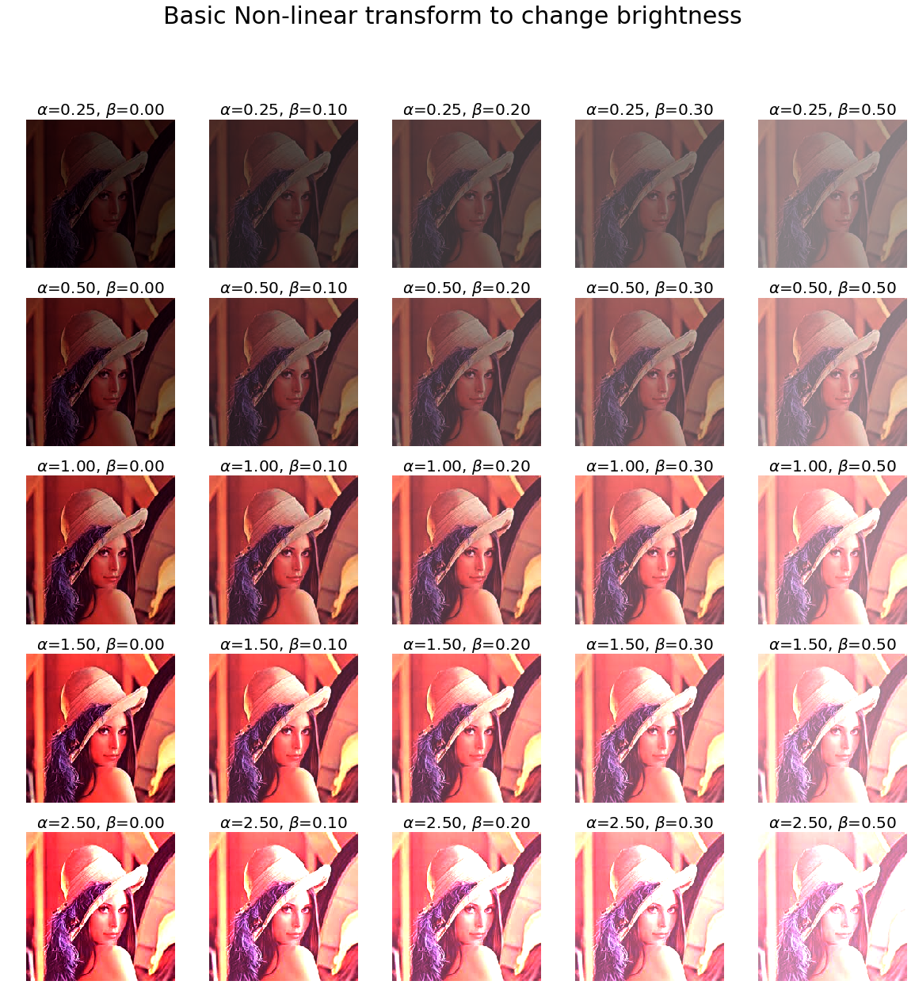

In [96]:
% matplotlib inline
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread

def basic_non_linear_transform(img, alpha, beta):
    return np.clip(alpha*img*img+beta, 0, 1)

image = imread('images/lena.jpg') / 255

plt.figure(figsize=(20,20))
i = 1
for alpha in [0.25, 0.5, 1, 1.5, 2.5]:
    for beta in [0, 0.1, 0.2, 0.3, 0.5]:
        image_corrected = basic_non_linear_transform(image, alpha, beta)
        plt.subplot(5,5,i), plt.imshow(image_corrected), plt.axis('off')
        plt.title(r'$\alpha$={:.2f}, $\beta$={:.2f}'.format(alpha, beta), size=20)
        i += 1
plt.suptitle('Basic Non-linear transform to change brightness', size=30)
plt.show()

### Colorspace Transformation: from RGB to Lab colorspace

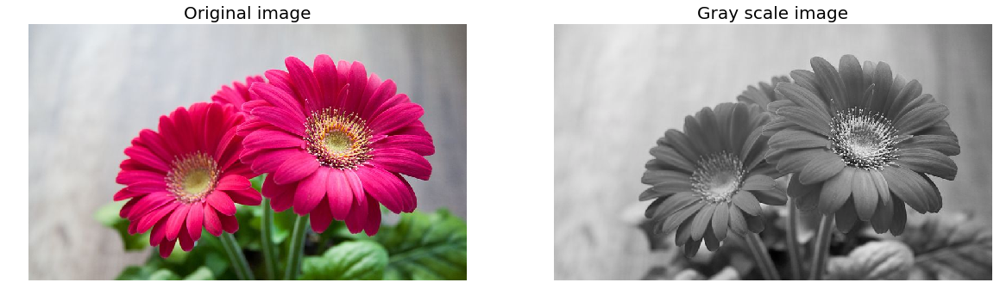

In [45]:
import numpy as np
from skimage import img_as_float
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb
from skimage.util import invert
from skimage.exposure import equalize_hist
import matplotlib.pylab as plt

im = imread('images/flowers.jpg')

im1 = rgb2lab(im)
im1[...,1] = im1[...,2] = 0
im1 = lab2rgb(im1)

plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Gray scale image', size=20)
plt.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\color\colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 114864 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


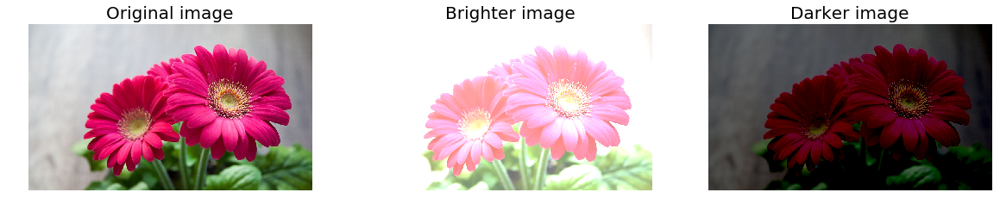

In [49]:
plt.figure(figsize=(20,5))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('Original image', size=20)

im1 = rgb2lab(im)
im1[...,0] = im1[...,0] + 50 
im1 = lab2rgb(im1)

plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title('Brighter image', size=20)

im1 = rgb2lab(im)
im1[...,0] = im1[...,0] - 50 
im1 = lab2rgb(im1)

plt.subplot(133), plt.imshow(im1), plt.axis('off'), plt.title('Darker image', size=20)

plt.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\color\colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 146 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


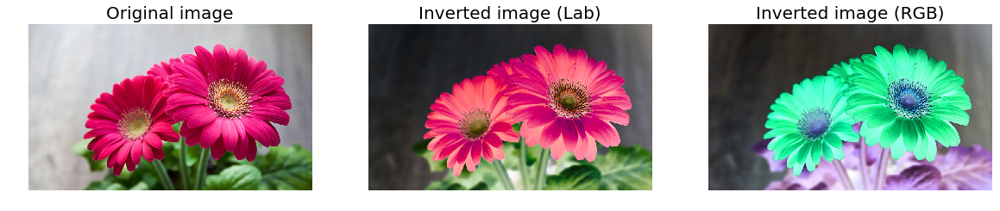

In [52]:
im1 = rgb2lab(im)
im1[...,0] = np.max(im1[...,0]) - im1[...,0]
im1 = lab2rgb(im1)

plt.figure(figsize=(20,6))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title('Inverted image (Lab)', size=20)
plt.subplot(133), plt.imshow(invert(im)), plt.axis('off'), plt.title('Inverted image (RGB)', size=20)
plt.show()

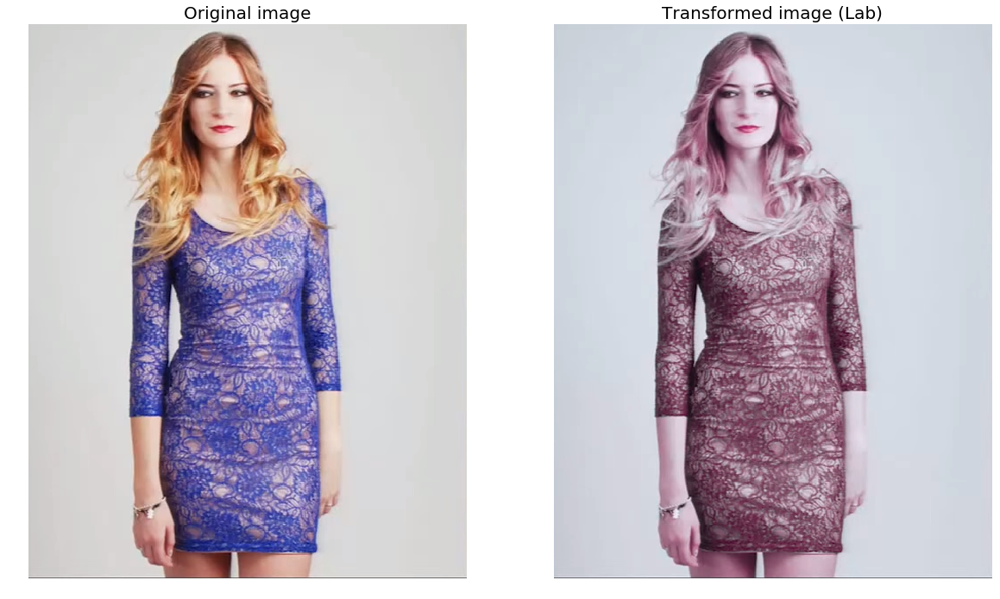

In [75]:
im = imread('images/lady_dress.png')

im1 = rgb2lab(im)
#im1[...,0] = np.max(im1[...,0]) - im1[...,0]
#im1[...,2] = -5 #np.max(im1[...,2]) - im1[...,2]
im2 = np.zeros(im1.shape)
im2[...,2] = 127
im1 = im1 + im2
im1[...,2] = -5
im1 = lab2rgb(im1)

plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Transformed image (Lab)', size=20)
plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

alpha, beta, gamma = 1, 0, 1

def basic_linear_transform(img, alpha, beta):
    return cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

def gamma_correction(img, gamma):
    lookup_table = np.empty((1,256), np.uint8)
    for i in range(256):
        lookup_table[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
    return cv2.LUT(img, lookup_table)

image = cv2.imread('images/Img_01_01.jpg') 

plt.figure(figsize=(20,20))
i = 1
for alpha in [0.25, 0.5, 1, 1.5, 2.5]:
    for beta in [0, 0.5, 1, 1.5, 2]:
        image_corrected = basic_linear_transform(image, alpha, beta)
        plt.subplot(5,5,i), plt.imshow(cv2.cvtColor(image_corrected, cv2.COLOR_BGR2RGB)), plt.axis('off')
        plt.title(r'$\alpha$={:.2f}, $\beta$={:.2f}'.format(alpha, beta), size=20)
        i += 1
plt.suptitle('Basic linear transform to change brightness', size=30)
plt.show()
        
plt.figure(figsize=(20,20))
i = 1
for gamma in np.linspace(0, 2, 16):
    image_gamma_corrected = gamma_correction(image, gamma)
    plt.subplot(4,4,i), plt.imshow(cv2.cvtColor(image_gamma_corrected, cv2.COLOR_BGR2RGB)), plt.axis('off')
    plt.title(r'$\gamma$={:.2f}'.format(gamma))
    i += 1
plt.suptitle('Gamma correction', size=30)
plt.show()

### Pencil Sketches from images

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\medpy\filter\smoothing.py:142: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\medpy\filter\smoothing.py:151: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


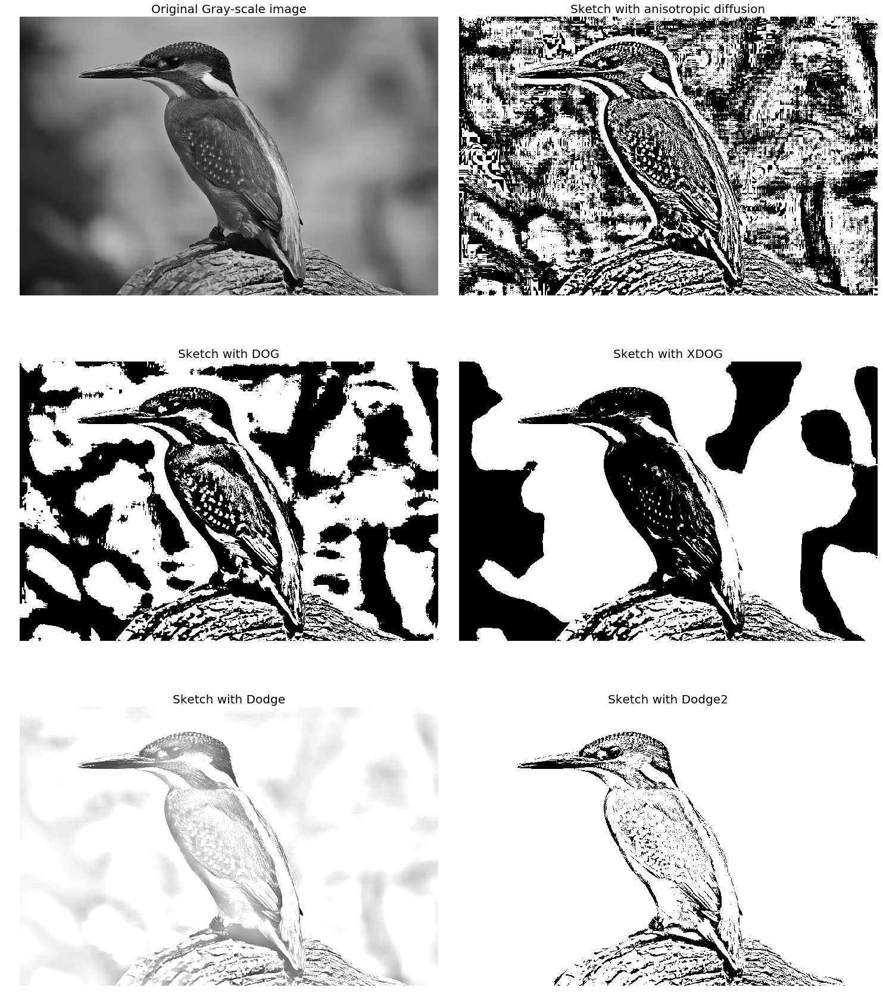

In [108]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import util
from skimage import img_as_float
import matplotlib.pylab as plt
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.filters import gaussian, threshold_otsu

def normalize(img):
    return (img-np.min(img))/(np.max(img)-np.min(img))

def sketch(img, edges):
    output = np.multiply(img, edges)
    output[output>1]=1
    output[edges==1]=1
    #output = normalize(output)
    return output

def edges_with_anisotropic_diffusion(img, niter=100, kappa=10, gamma=0.1):
    #img = gaussian(img, sigma=0.05)
    output = img - anisotropic_diffusion(img, niter=niter, kappa=kappa, gamma=gamma, voxelspacing=None, option=1)
    output[output > 0] = 1
    output[output < 0] = 0
    #output = np.clip(output, 0, 1)
    #thresh = threshold_otsu(output)
    #output = np.invert(output > thresh)
    return output

def edges_with_dodge2(img):
    img_blurred = gaussian(util.invert(img), sigma=5)
    output = np.divide(img, util.invert(img_blurred))
    output = normalize(output)
    thresh = threshold_otsu(output)
    output = output > thresh
    return output


def sketch_with_dodge(img):
    orig = img
    blur = gaussian(util.invert(img), sigma=20)
    result=blur/util.invert(orig) 
    result[result>1]=1
    result[orig==1]=1
    return result

# with DOG
def edges_with_DOG(img, k = 200, gamma = 1):
    sigma = 0.5
    output = gaussian(img, sigma=sigma) - gamma*gaussian(img, sigma=k*sigma)
    output[output > 0] = 1
    output[output < 0] = 0 
    return output

def sketch_with_XDOG(image, epsilon=0.01):
  """
  Computes the eXtended Difference of Gaussians (XDoG) for a given image. This 
  is done by taking the regular Difference of Gaussians, thresholding it
  at some value, and applying the hypertangent function the the unthresholded
  values.
  image: an n x m single channel matrix.
  epsilon: the offset value when computing the hypertangent.
  returns: an n x m single channel matrix representing the XDoG.
  """
  phi = 10

  difference = edges_with_DOG(image, 200, 0.98).astype(np.uint8)
  #difference = sketch(image, difference)
  #difference = normalize(difference)  

  for i in range(0, len(difference)):
    for j in range(0, len(difference[0])):
      if difference[i][j] >= epsilon:
        difference[i][j] = 1
      else:
        ht = np.tanh(phi*(difference[i][j] - epsilon))
        difference[i][j] = 1 + ht
  difference = normalize(difference)  
  return difference

def plot_sketches(img_file):
    img = rgb2gray(imread(img_file))
    plt.figure(figsize=(20,25))
    output_aniso = sketch(img, edges_with_anisotropic_diffusion(img))
    output_dog = sketch(img, edges_with_DOG(img, k=25))
    output_xdog = sketch_with_XDOG(img)
    output_dodge = sketch_with_dodge(img)
    output_dodge2 = sketch(img, edges_with_dodge2(img))
    plt.subplots_adjust(left=0, right=1, bottom=0, top=0.95, hspace=0.05, wspace=0.05) 
    plt.subplot(321), plt.imshow(img), plt.axis('off')
    plt.title('Original Gray-scale image', size=20)
    plt.subplot(322), plt.imshow(output_aniso), plt.axis('off')
    plt.title('Sketch with anisotropic diffusion', size=20)
    plt.subplot(323), plt.imshow(output_dog), plt.axis('off')
    plt.title('Sketch with DOG', size=20)
    plt.subplot(324), plt.imshow(output_xdog), plt.axis('off')
    plt.title('Sketch with XDOG', size=20)
    plt.subplot(325), plt.imshow(output_dodge), plt.axis('off')
    plt.title('Sketch with Dodge', size=20)
    plt.subplot(326), plt.imshow(output_dodge2), plt.axis('off')
    plt.title('Sketch with Dodge2', size=20)
    #plt.show()
    plt.savefig(img_file.split('.')[0] + '.png', bbox_in='tight')

plt.gray()
img = 'images/bird.jpg'
plot_sketches(img)

### Cartoonizing

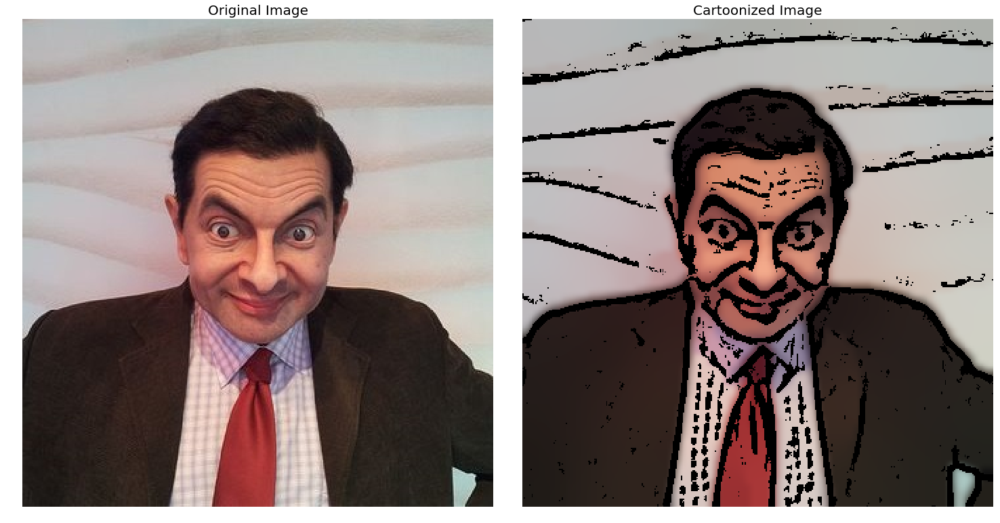

In [112]:
import cv2
import numpy as np
import matplotlib.pylab as plt

num_down = 2       # number of downsampling steps
num_bilateral = 7  # number of bilateral filtering steps

    
img = plt.imread("images/bean.jpg")
w, h, _ = img.shape
  
# downsample image using Gaussian pyramid
img_color = np.copy(img)
for _ in range(num_down):
    img_color = cv2.pyrDown(img_color)
 
# repeatedly apply small bilateral filter instead of
# applying one large filter
for _ in range(num_bilateral):
    img_color = cv2.bilateralFilter(img_color, d=9,
                                    sigmaColor=9,
                                    sigmaSpace=7)

# upsample image to original size
for _ in range(num_down):
    img_color = cv2.pyrUp(img_color)
    
img_color = cv2.resize(img_color, (img.shape[1], img.shape[0]))

# convert to grayscale and apply median blur
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_blur = cv2.medianBlur(img_gray, 7)

# detect and enhance edges
img_edge = cv2.adaptiveThreshold(img_blur, 255,
                                 cv2.ADAPTIVE_THRESH_MEAN_C,
                                 cv2.THRESH_BINARY,
                                 blockSize=9,
                                 C=2)

# convert back to color, bit-AND with color image
img_edge = cv2.cvtColor(img_edge, cv2.COLOR_GRAY2RGB)
img_cartoon = cv2.bitwise_and(img_color, img_edge)

# display
fig = plt.figure(figsize=(20,10))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05) 
plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.title('Original Image', size=20)
plt.subplot(122)
plt.imshow(img_cartoon)
plt.axis('off')
plt.title('Cartoonized Image', size=20)

plt.show()

### Gotham Instagram Filter

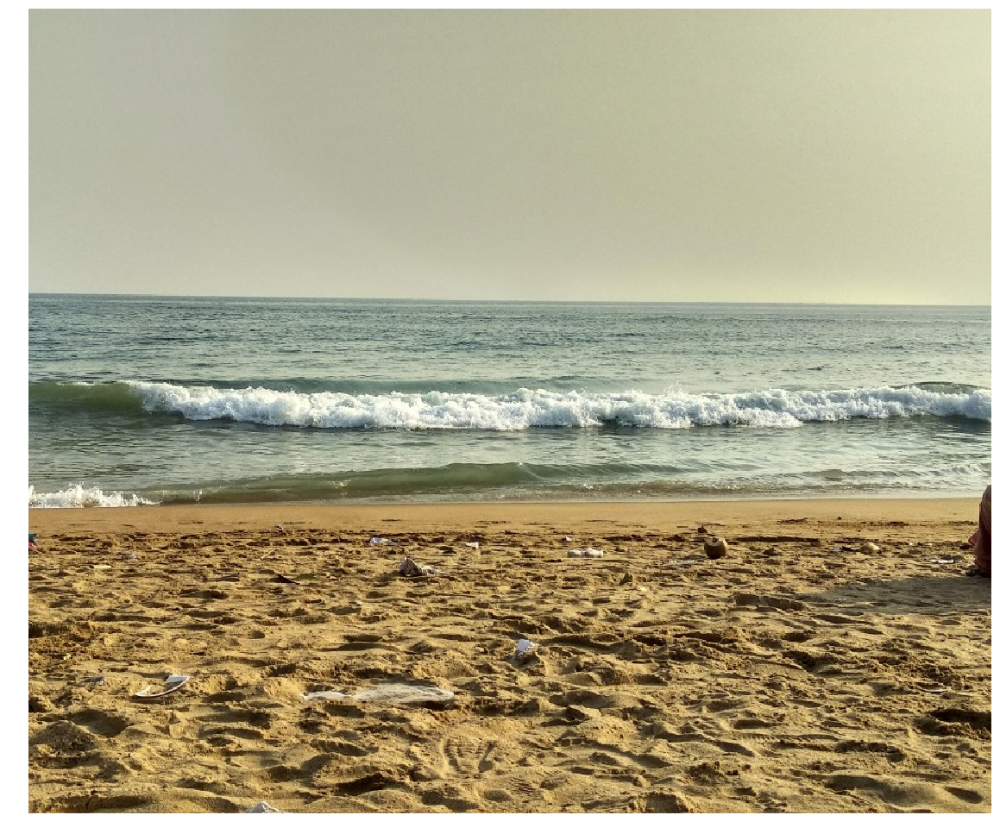

In [119]:
from PIL import Image
import numpy as np
import matplotlib.pylab as plt
im = Image.open('images/sea.jpg') # assumed pixel values in [0,255]
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.axis('off')
plt.show()

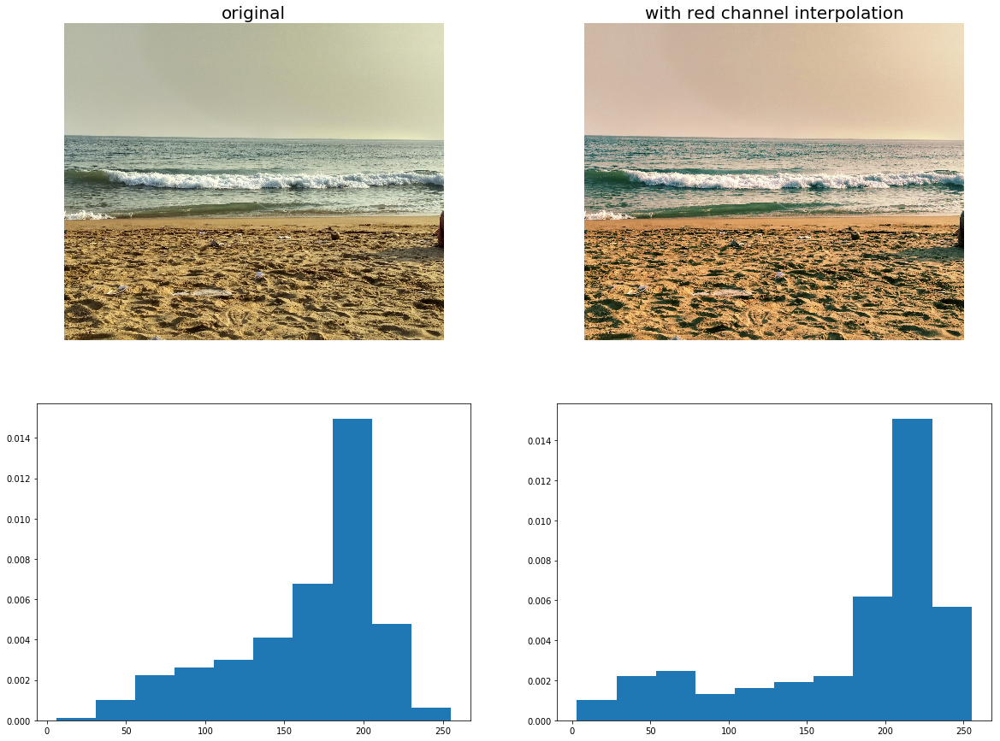

In [120]:
r, g, b = im.split() # split the channels
r_old = np.linspace(0,255,11)   # reference points
r_new = [0., 12.75, 25.5, 51., 76.5, 127.5, 178.5, 204., 229.5, 242.25, 255.] # new values at reference points

# strech the red channel histogram with interpolation and obtain new red channel values for each pixel                       
r1 = Image.fromarray((np.reshape(np.interp(np.array(r).ravel(), r_old, r_new),
                                 (im.height, im.width))).astype(np.uint8), mode='L')

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(222)
im1 = Image.merge('RGB', (r1, g, b))
plt.imshow(im1)
plt.axis('off')
plt.title('with red channel interpolation', size=20)
plt.subplot(223)
plt.hist(np.array(r).ravel(), normed=True)
plt.subplot(224)
plt.hist(np.array(r1).ravel(), normed=True)
plt.show()

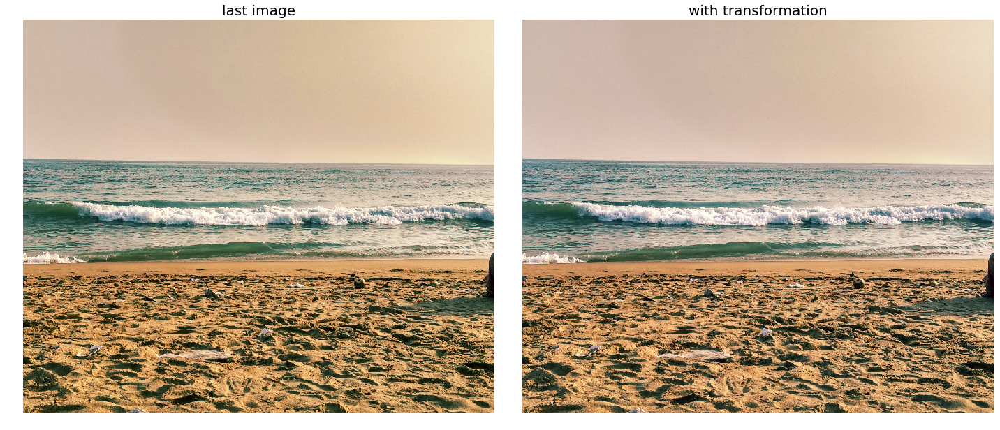

In [121]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(im1)
plt.title('last image', size=20)
plt.axis('off')
b1 = Image.fromarray(np.clip(np.array(b) + 7.65, 0, 255).astype(np.uint8))
im1 = Image.merge('RGB', (r1, g, b1))
plt.subplot(122)
plt.imshow(im1)
plt.axis('off')
plt.title('with transformation', size=20)
plt.tight_layout()
plt.show()

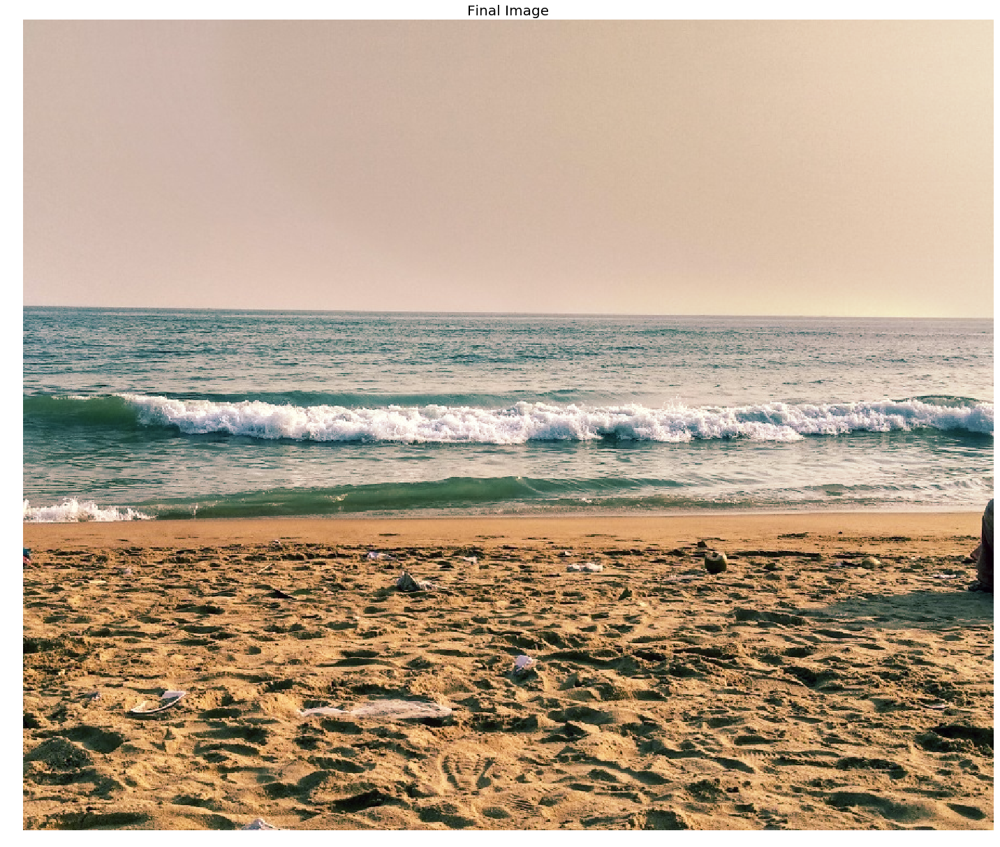

In [122]:
plt.figure(figsize=(20,20))
plt.imshow(im1)
plt.axis('off')
plt.title('Final Image', size=20)
plt.tight_layout()
plt.show()

### Seam Carving

(480, 320, 3)


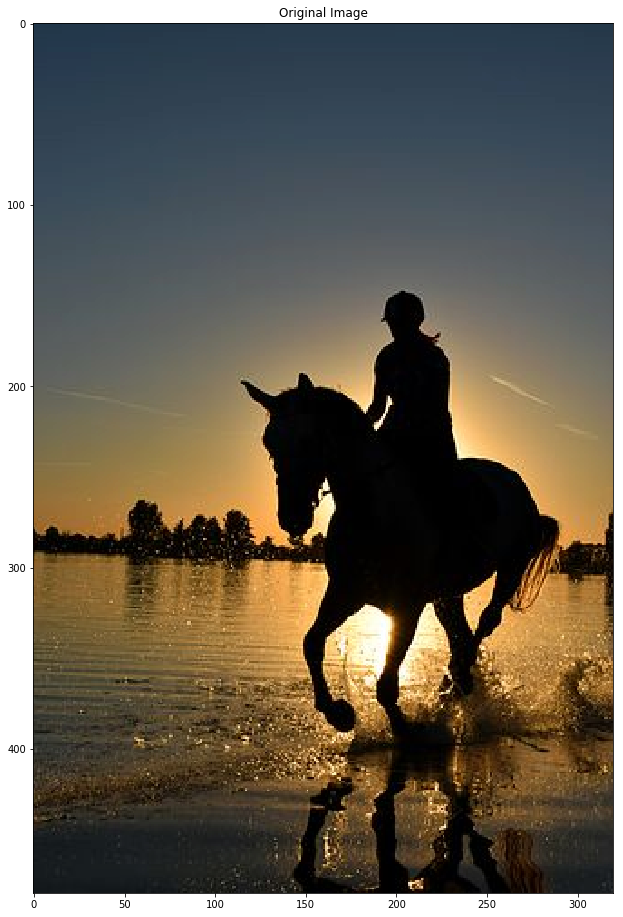

(<matplotlib.text.Text at 0x254cfa997b8>,
 None)

In [124]:
from skimage import data, draw
from skimage import transform, util
import numpy as np
from skimage import filters, color
from matplotlib import pylab as plt
image = imread('images/sea_horse.jpg')
print(image.shape)
# (480, 320, 3)
image = util.img_as_float(image)
energy_image = filters.sobel(color.rgb2gray(image))
plt.figure(figsize=(20,16))
plt.title('Original Image'), plt.imshow(image), plt.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


(380, 320, 3) (380, 320, 3)


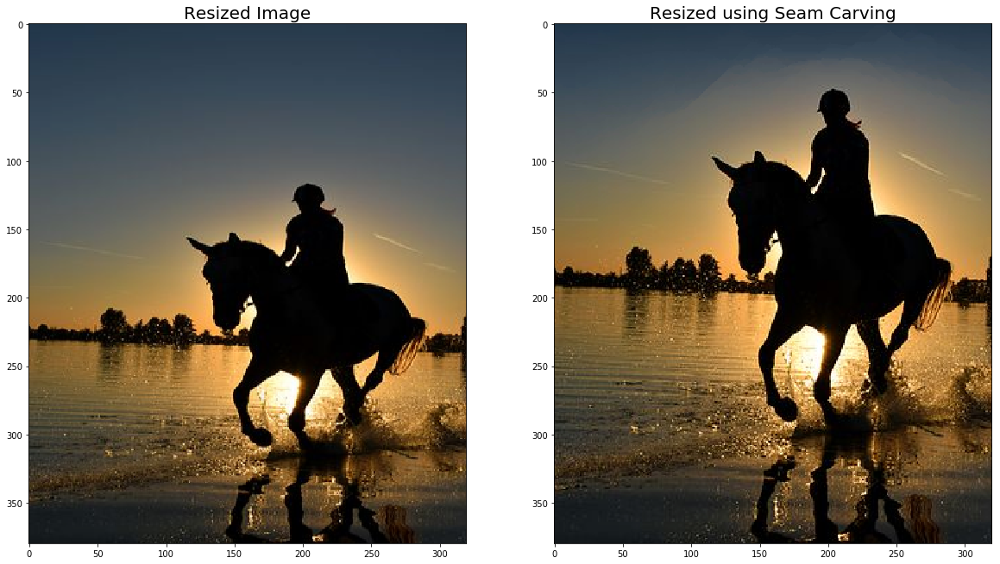

In [132]:
resized = transform.resize(image, (image.shape[0] - 100, image.shape[1]), mode='reflect')
image = util.img_as_float(image)
energy_image = filters.sobel(color.rgb2gray(image))
seam_resized = transform.seam_carve(image, energy_image, 'horizontal', 100)
print(resized.shape, seam_resized.shape)
plt.figure(figsize=(20,20))
plt.subplot(121), plt.title('Resized Image', size=20), plt.imshow(resized)
plt.subplot(122), plt.title('Resized using Seam Carving', size=20), plt.imshow(seam_resized)
plt.show()